**Task 1**

In [4]:
import cv2
import numpy as np

In [22]:
import cv2
import numpy as np
from scipy import ndimage

# Convert RGB image to grayscale
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.3, 0.59, 0.11])

# Design a 3x3 convolution and correlation filter
kernel = np.ones((3,3),np.float32)/9

for i in range(1, 21):
    # Load an image
    img = cv2.imread(f'/content/image dataset/{i}.jpg')

    gray = rgb2gray(img)

    convolution = cv2.filter2D(gray,-1,kernel)
    correlation = ndimage.correlate(gray, kernel)

    # Design 1st order derivative and 2nd Order derivative filter
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=5)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=5)

    laplacian = cv2.Laplacian(gray,cv2.CV_64F)

    # Apply relative filter on input images to remove the noise
    # Assuming the noise is Gaussian, we can use a Gaussian blur
    blur = cv2.GaussianBlur(gray,(5,5),0)

    # Implement Laplacian edge detection on your dataset
    edges = cv2.Laplacian(blur,cv2.CV_64F)


Results for image 1:


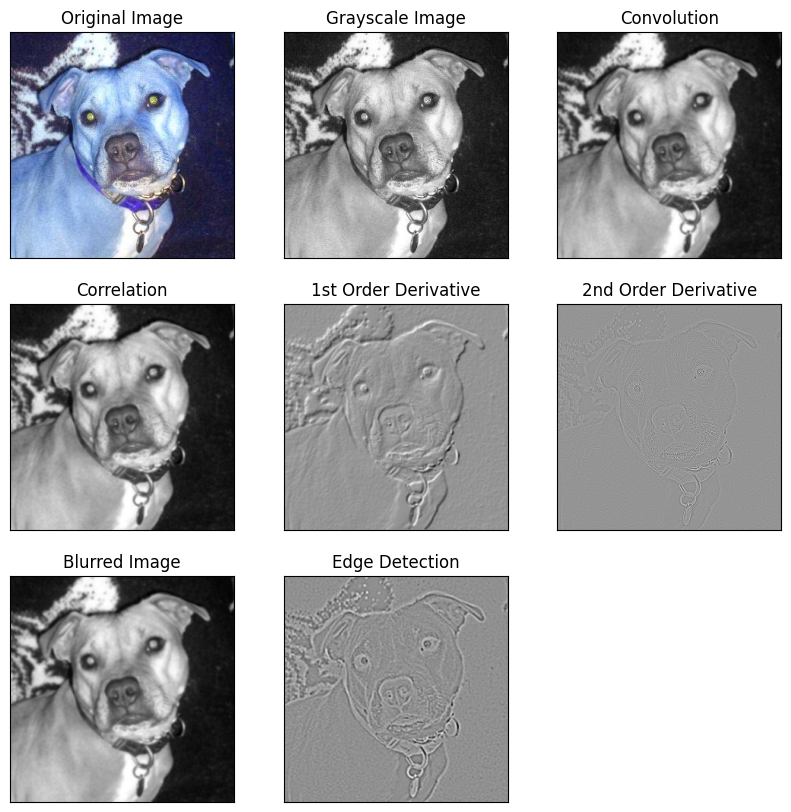

Results for image 2:


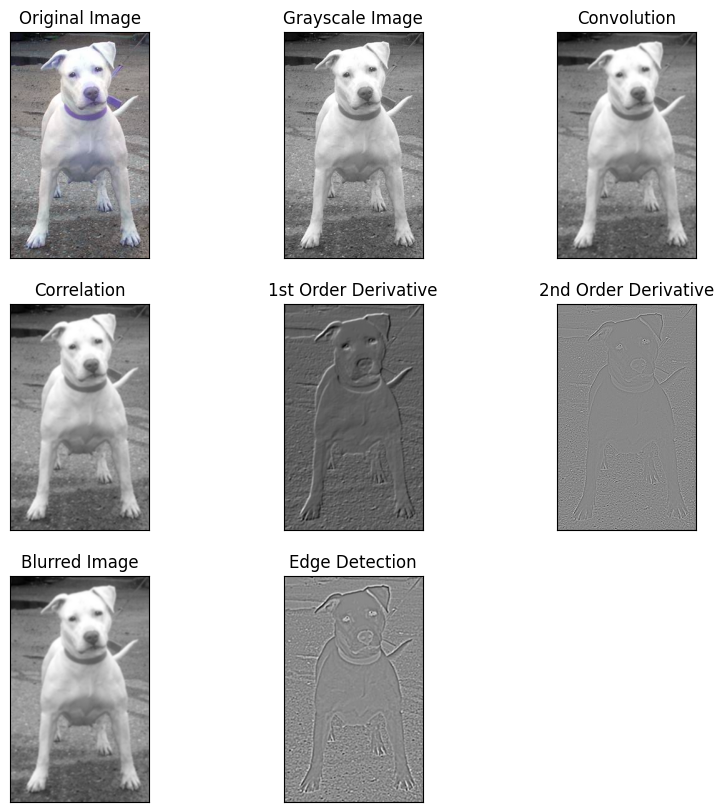

Results for image 3:


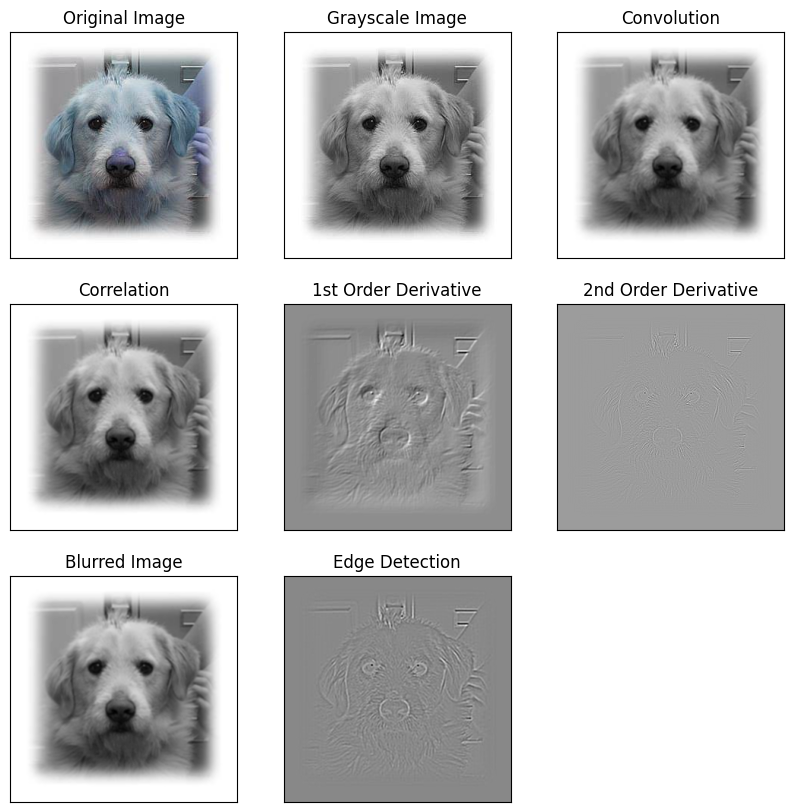

Results for image 4:


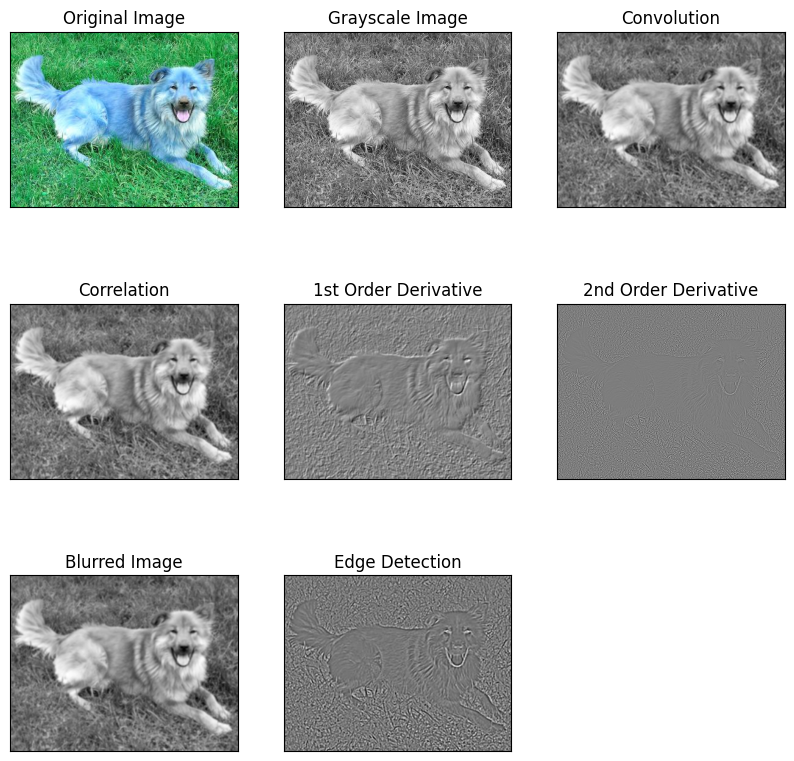

Results for image 5:


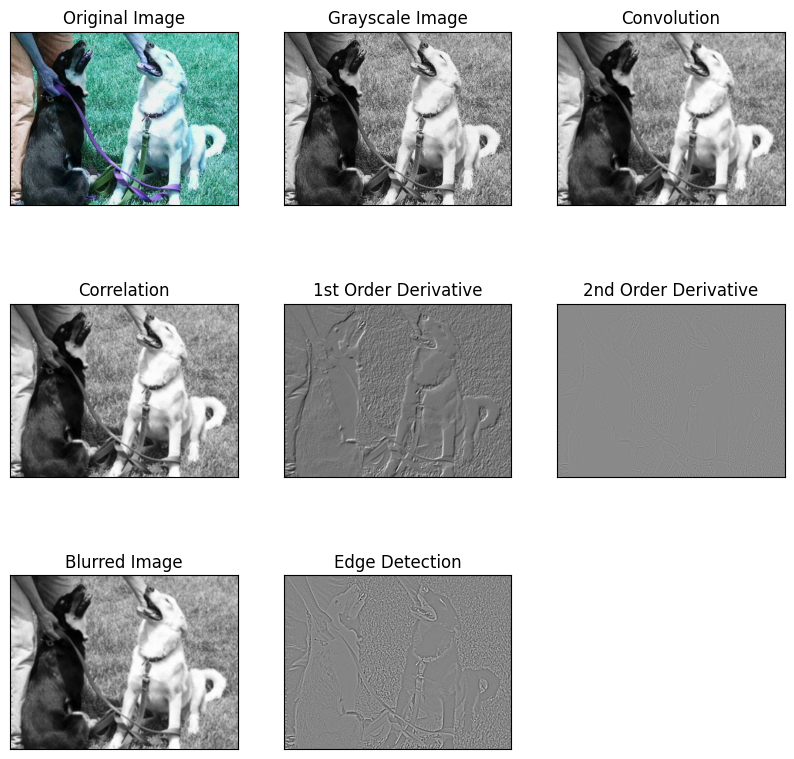

Results for image 6:


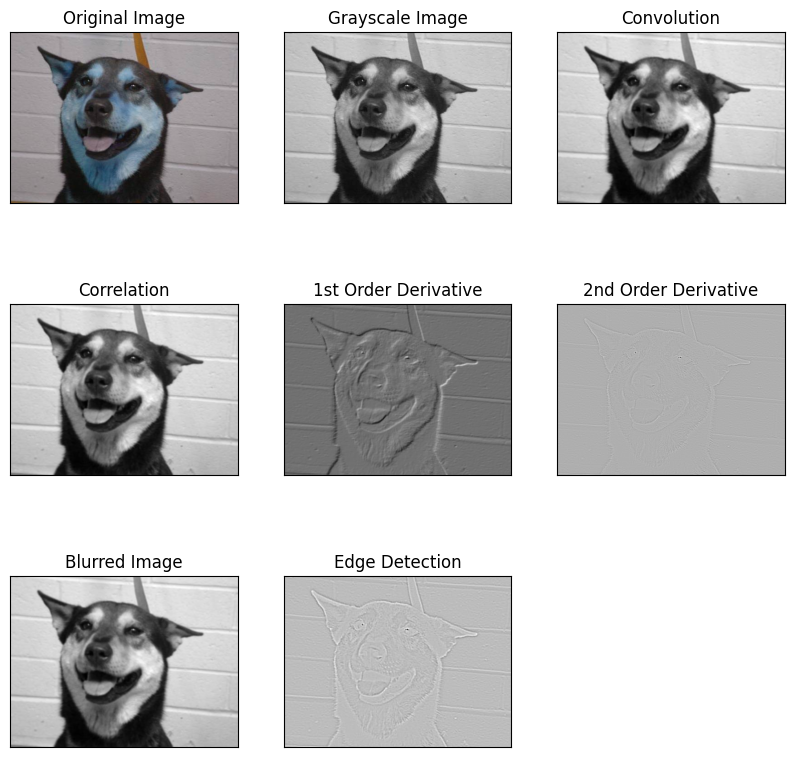

Results for image 7:


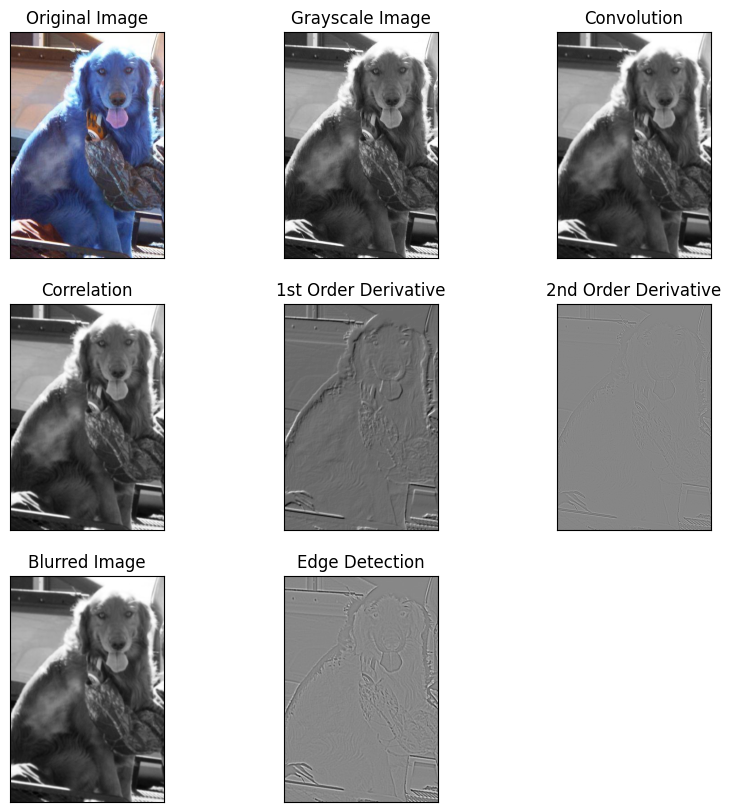

Results for image 8:


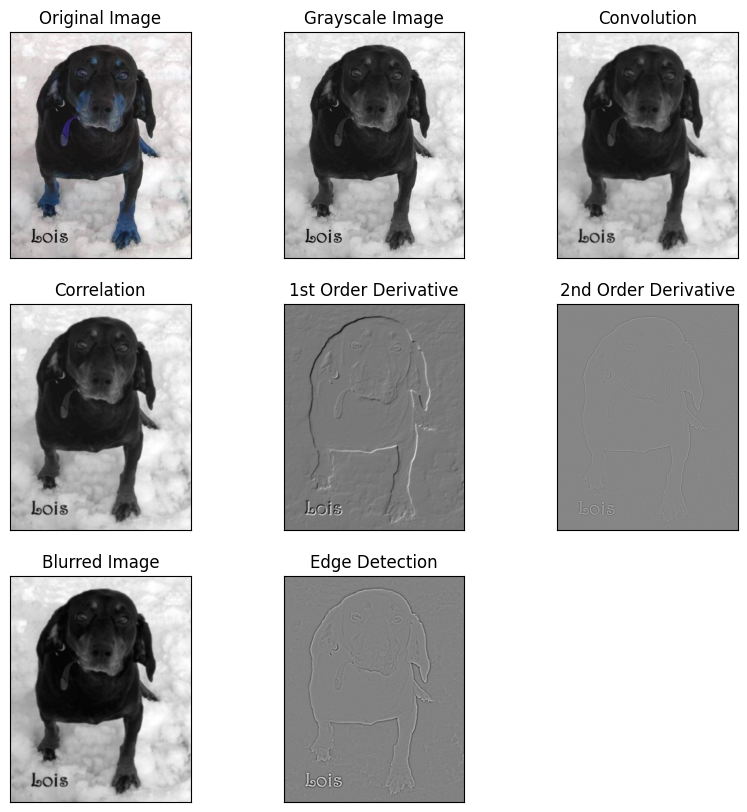

Results for image 9:


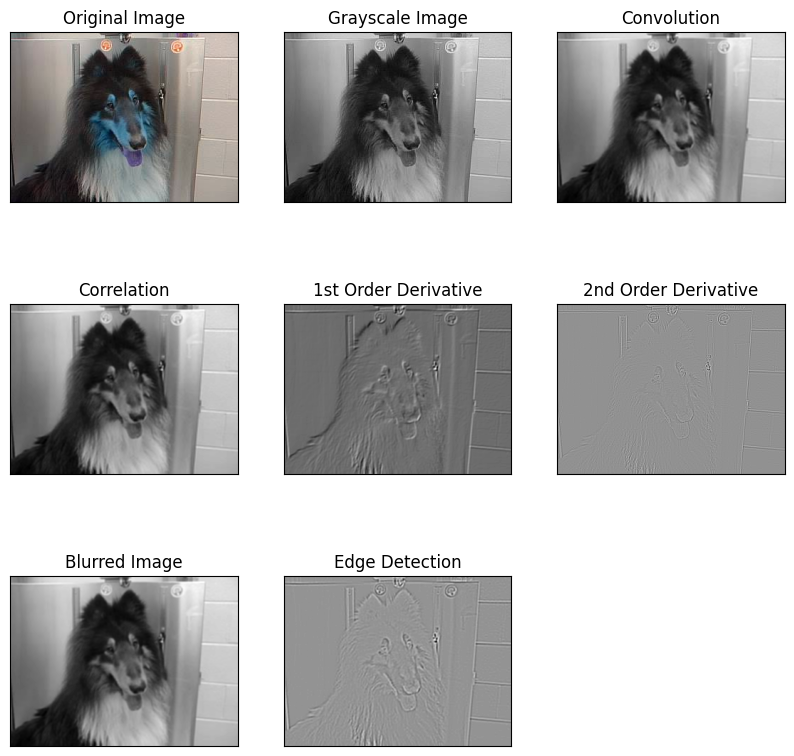

Results for image 10:


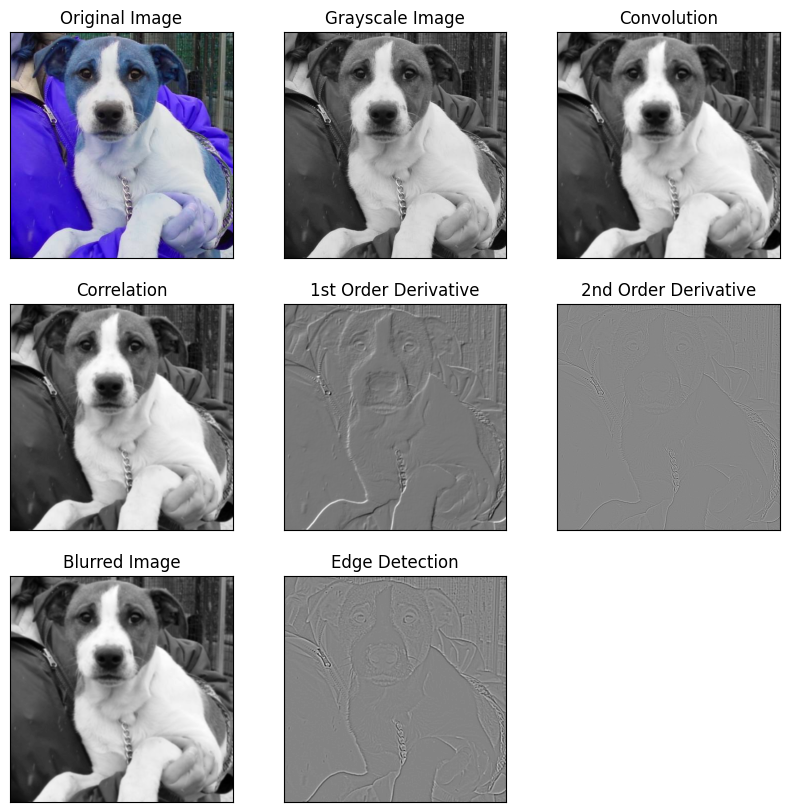

Results for image 11:


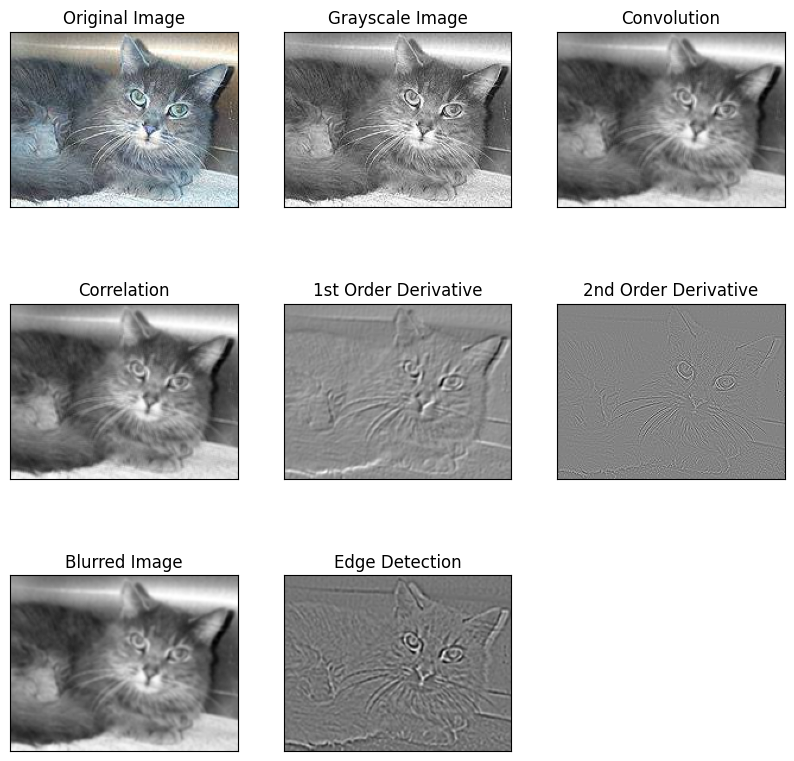

Results for image 12:


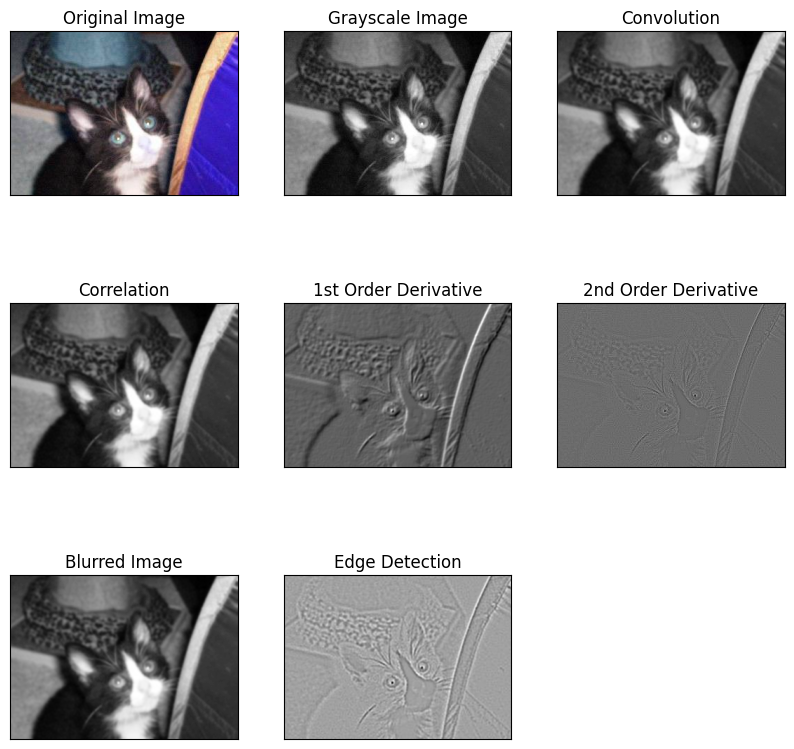

Results for image 13:


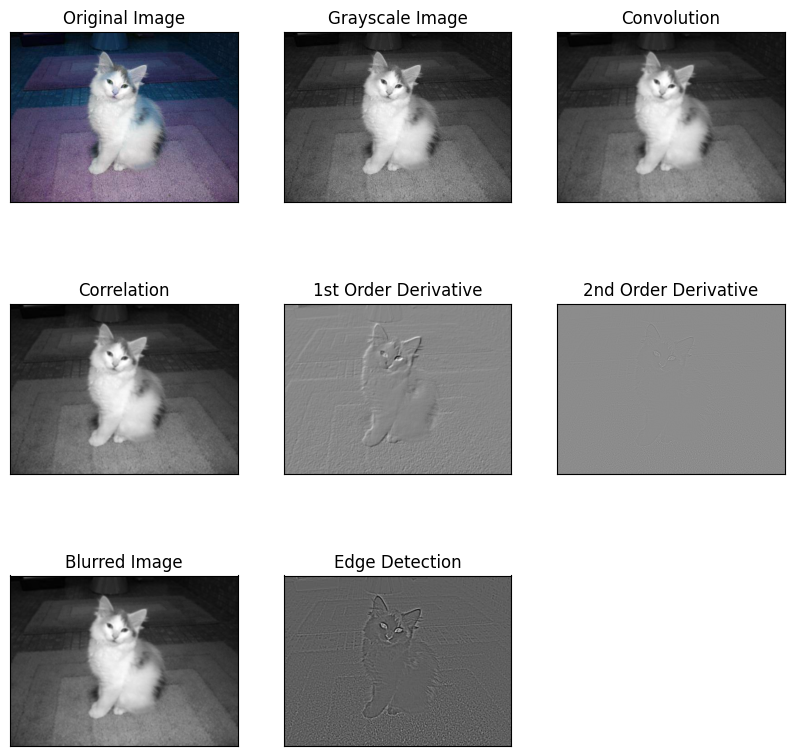

Results for image 14:


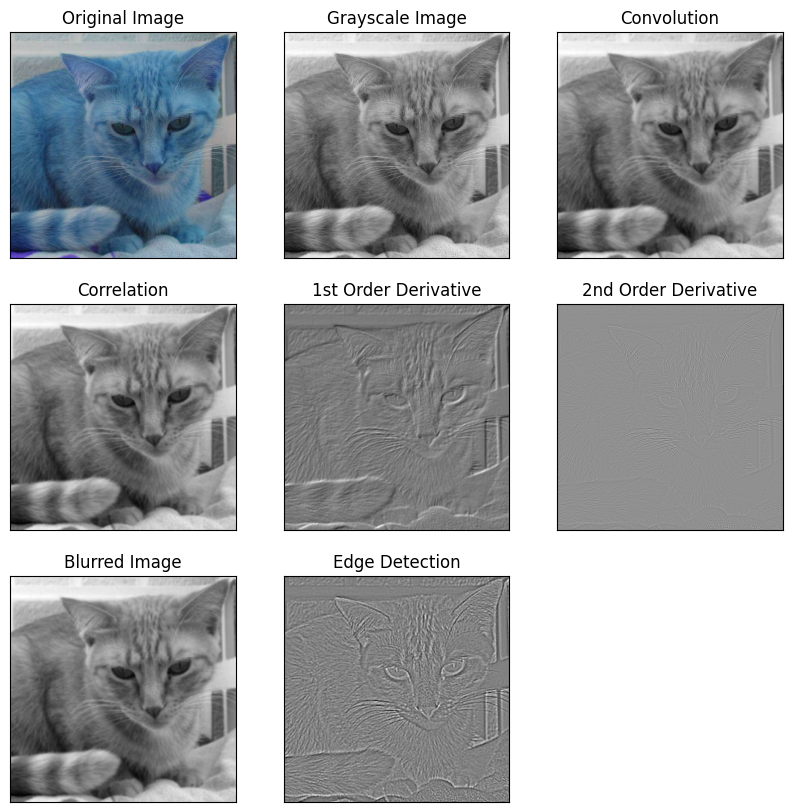

Results for image 15:


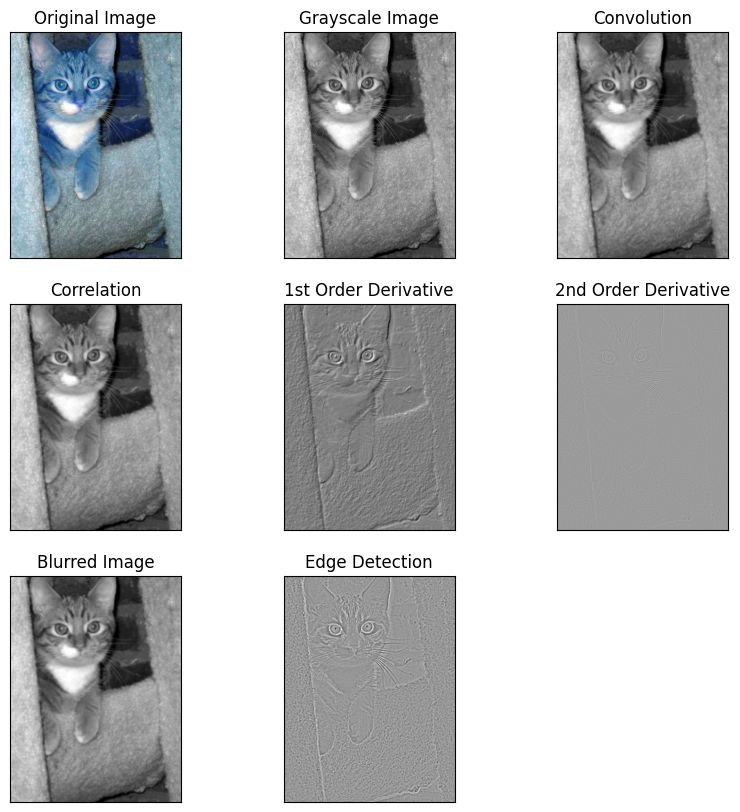

Results for image 16:


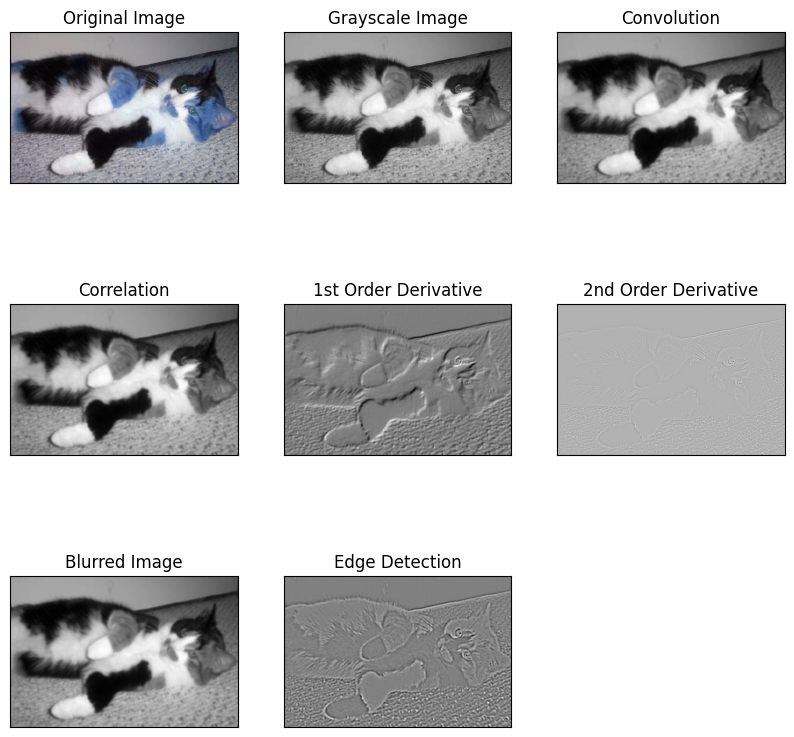

Results for image 17:


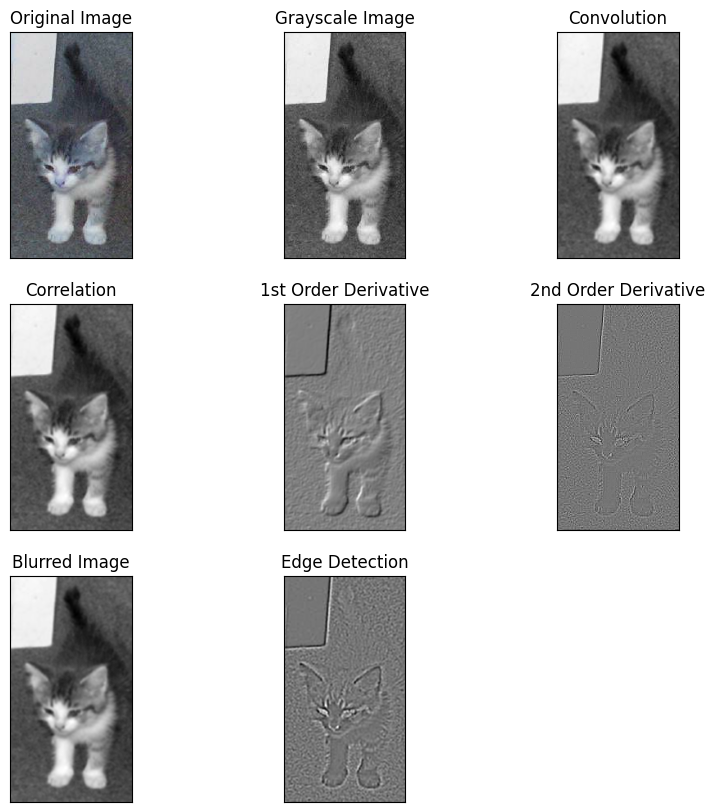

Results for image 18:


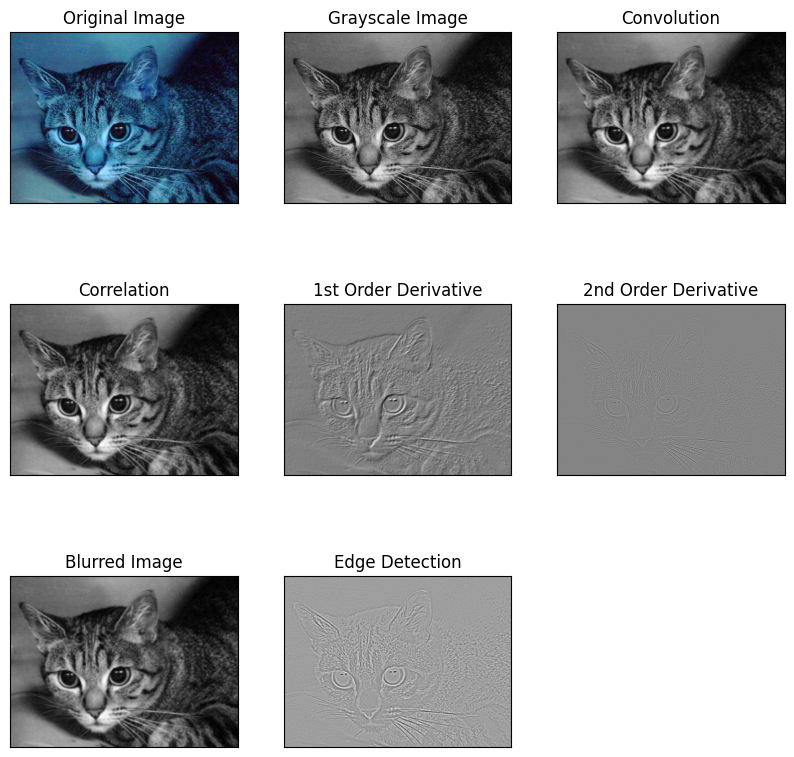

Results for image 19:


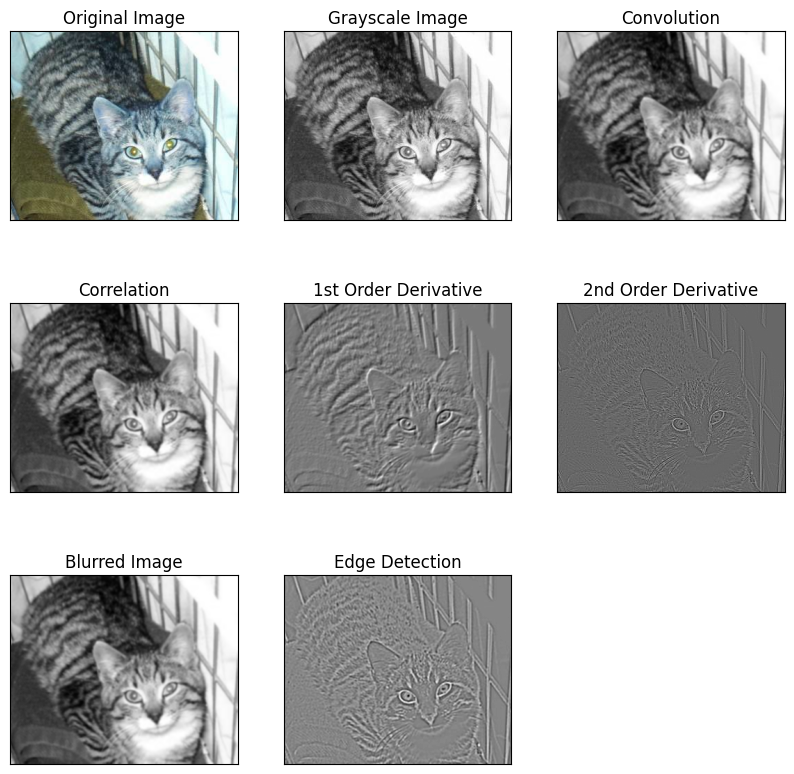

Results for image 20:


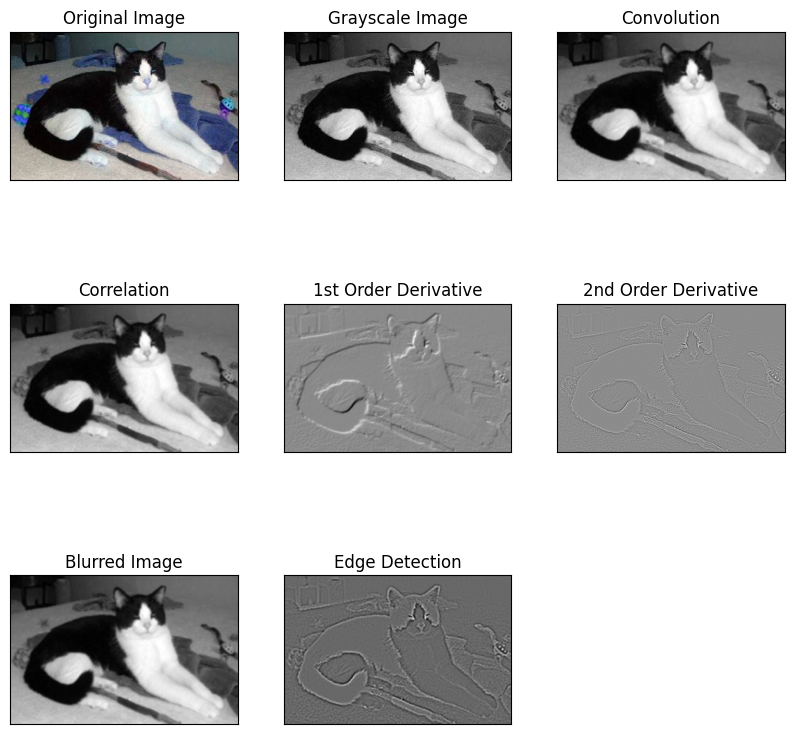

In [23]:
import matplotlib.pyplot as plt

for i in range(1, 21):
    # Load an image
    img = cv2.imread(f'/content/image dataset/{i}.jpg')

    gray = rgb2gray(img)
    convolution = cv2.filter2D(gray,-1,kernel)
    correlation = ndimage.correlate(gray, kernel)
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=5)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=5)
    laplacian = cv2.Laplacian(gray,cv2.CV_64F)
    blur = cv2.GaussianBlur(gray,(5,5),0)
    edges = cv2.Laplacian(blur,cv2.CV_64F)

    # Display the images
    plt.figure(figsize=(10,10))
    plt.subplot(331),plt.imshow(img, cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(332),plt.imshow(gray, cmap = 'gray')
    plt.title('Grayscale Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(333),plt.imshow(convolution, cmap = 'gray')
    plt.title('Convolution'), plt.xticks([]), plt.yticks([])
    plt.subplot(334),plt.imshow(correlation, cmap = 'gray')
    plt.title('Correlation'), plt.xticks([]), plt.yticks([])
    plt.subplot(335),plt.imshow(sobelx + sobely, cmap = 'gray')
    plt.title('1st Order Derivative'), plt.xticks([]), plt.yticks([])
    plt.subplot(336),plt.imshow(laplacian, cmap = 'gray')
    plt.title('2nd Order Derivative'), plt.xticks([]), plt.yticks([])
    plt.subplot(337),plt.imshow(blur, cmap = 'gray')
    plt.title('Blurred Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(338),plt.imshow(edges, cmap = 'gray')
    plt.title('Edge Detection'), plt.xticks([]), plt.yticks([])

    # Show all plots
    print(f"Results for image {i}:")
    plt.show()


**Task 2**

In [3]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [5]:
import pandas as pd

In [6]:
data=pd.read_csv("/content/Labelled  Tweets.csv")
data

,Class,Tweets
0,1,!!! RT @mayasolovely: As a woman you shouldn't...
1,0,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...
2,0,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...
3,0,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...
4,0,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...
...,...,...
24778,0,you's a muthaf***in lie &#8220;@LifeAsKing: @2...
24779,1,"you've gone and broke the wrong heart baby, an..."
24780,0,young buck wanna eat!!.. dat nigguh like I ain...
24781,0,youu got wild bitches tellin you lies


In [15]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

def load_and_tokenize(filename):
    try:
        with open(filename, 'r') as file:
            raw_text = file.read()

            sentences = sent_tokenize(raw_text)
            tokenized_sentences = [word_tokenize(sentence) for sentence in sentences]
            return tokenized_sentences
    except FileNotFoundError:
        print(f"File '{filename}' not found.")
        return []

def remove_stopwords(tokenized_text):
    stop_words = set(stopwords.words('english'))
    filtered_text = [[word for word in sentence if word.lower() not in stop_words] for sentence in tokenized_text]
    return filtered_text

def apply_stemming(tokenized_text):
    stemmer = PorterStemmer()
    stemmed_text = [[stemmer.stem(word) for word in sentence] for sentence in tokenized_text]
    return stemmed_text

def apply_lemmatization(tokenized_text):
    lemmatizer = WordNetLemmatizer()
    lemmatized_text = [[lemmatizer.lemmatize(word) for word in sentence] for sentence in tokenized_text]
    return lemmatized_text

def append_sentence_boundaries(tokenized_text):
    marked_text = [['<s>'] + sentence + ['</s>'] for sentence in tokenized_text]
    return marked_text

def save_to_file(filename, preprocessed_text):
    with open(filename, 'w') as file:
        for sentence in preprocessed_text:
            file.write(' '.join(sentence) + '\n')

filename = '/content/Labelled  Tweets.csv'
tokenized_text = load_and_tokenize(filename)
filtered_text = remove_stopwords(tokenized_text)
stemmed_text = apply_stemming(filtered_text)
lemmatized_text = apply_lemmatization(filtered_text)
marked_text = append_sentence_boundaries(lemmatized_text)

output_filename = 'preprocessed.txt'
save_to_file(output_filename, marked_text)
print(f"Preprocessed text saved to '{output_filename}'.")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Preprocessed text saved to 'preprocessed.txt'.


In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import numpy as np

data = pd.read_csv('/content/Labelled  Tweets.csv')

train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)
#for the bow
count_vectorizer = CountVectorizer()
train_count = count_vectorizer.fit_transform(train_data['Tweets'])
test_count = count_vectorizer.transform(test_data['Tweets'])

print("Count Vectorization Results:")
print("Vocabulary (features):", count_vectorizer.get_feature_names_out())
print("Example Count Vectorized Tweet:")
print(train_count[0])
#for the tf_idf
tfidf_vectorizer = TfidfVectorizer()
train_tfidf = tfidf_vectorizer.fit_transform(train_data['Tweets'])
test_tfidf = tfidf_vectorizer.transform(test_data['Tweets'])

print("\nTF-IDF Vectorization Results:")
print("Vocabulary (features):", tfidf_vectorizer.get_feature_names_out())
print(train_tfidf[0])

Count Vectorization Results:
Vocabulary (features): ['00' '000' '0000000000000' ... 'zzzentropy' 'zzzquil' 'zzzzzz']
Example Count Vectorized Tweet:
  (0, 23167)	1
  (0, 10945)	1
  (0, 26700)	1
  (0, 29373)	1
  (0, 12965)	1
  (0, 9338)	1
  (0, 29694)	1
  (0, 29554)	1
  (0, 21340)	1
  (0, 11261)	1
  (0, 28468)	1
  (0, 27308)	2
  (0, 10566)	1
  (0, 20177)	1
  (0, 12912)	1
  (0, 20511)	1
  (0, 20150)	1
  (0, 26601)	1
  (0, 20371)	1
  (0, 21430)	1
  (0, 20887)	1
  (0, 19759)	1
  (0, 12704)	1
  (0, 1254)	1

TF-IDF Vectorization Results:
Vocabulary (features): ['00' '000' '0000000000000' ... 'zzzentropy' 'zzzquil' 'zzzzzz']
  (0, 1254)	0.12490882131477635
  (0, 12704)	0.1833930030006383
  (0, 19759)	0.10534547055658293
  (0, 20887)	0.22258576264113236
  (0, 21430)	0.19563394170856363
  (0, 20371)	0.2624092405612386
  (0, 26601)	0.1642368246533138
  (0, 20150)	0.17385347475139545
  (0, 20511)	0.22991333229487346
  (0, 12912)	0.31831651860274857
  (0, 20177)	0.19785230836405127
  (0, 10566)	0.

In [16]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split

data = pd.read_csv('/content/Labelled  Tweets.csv')

data = data.head(1000)

X_train, X_test, y_train, y_test = train_test_split(data['Tweets'], data['Class'], test_size=0.2, random_state=42)

count_vectorizer = CountVectorizer()
X_train_count = count_vectorizer.fit_transform(X_train)
X_test_count = count_vectorizer.transform(X_test)

tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

def sigmoid(z):
    return 1 / (1 + np.exp(-z))

num_features = X_train_count.shape[1]
learning_rate = 0.01
epochs = 100

weights_bow = np.zeros(num_features)

for epoch in range(epochs):
    predicted_probs = sigmoid(X_train_count.dot(weights_bow))
    gradient = X_train_count.T.dot(predicted_probs - y_train) / len(y_train)
    weights_bow -= learning_rate * gradient

weights_tfidf = np.zeros(num_features)

for epoch in range(epochs):
    predicted_probs = sigmoid(X_train_tfidf.dot(weights_tfidf))
    gradient = X_train_tfidf.T.dot(predicted_probs - y_train) / len(y_train)
    weights_tfidf -= learning_rate * gradient

predicted_probs_bow = sigmoid(X_test_count.dot(weights_bow))
predicted_probs_tfidf = sigmoid(X_test_tfidf.dot(weights_tfidf))